# Propagation of Hole waveguide (Antiguide)

Empty hole in glass. N0 configuration in Bird.  Odd input field


In [1]:
import numpy as np
import matplotlib.pyplot as plt
from slab import SlabExact
from fiberamp.fiber.microstruct.bragg import plotlogf, plotlogf_real, plotlogf_imag
from scipy.optimize import newton
from scipy.integrate import quad
from IPython.display import Video

import json

plt.style.use('dark_background')
%matplotlib widget

In [2]:
A = SlabExact(scale=1e-6, Ts=[2., 2., 2.], xrefs=[300, 500, 300],
              ns=[1.44, 1, 1.44], wl=1e-6, symmetric=True)


In [6]:
def quadratic_piecewise(x):
    conds = [(x<-.5), ((-.5<=x)*(x<=.5)), (x>.5)]
    funcs = [0, lambda x: .25-x**2, 0]
    return np.piecewise(x, conds, funcs)

def cubic_piecewise(x):
    conds = [(x<-.5), ((-.5<=x)*(x<=.5)), (x>.5)]
    funcs = [0, lambda x: 7*x*(.25-x**2), 0]
    return np.piecewise(x, conds, funcs)
    
def modified_dist(x):
    return (x-1/4) * np.exp(-(x-1/2)**2)  

def odd_modified_dist(x):
    return x * np.exp(-x**2)
    
def normal_dist(x):
    return np.exp(-x**2)

In [7]:
# Set input function
f0 = cubic_piecewise
f0_shifted = lambda x: f0(x) + 1
# Set input field type
field_type = 'TE'

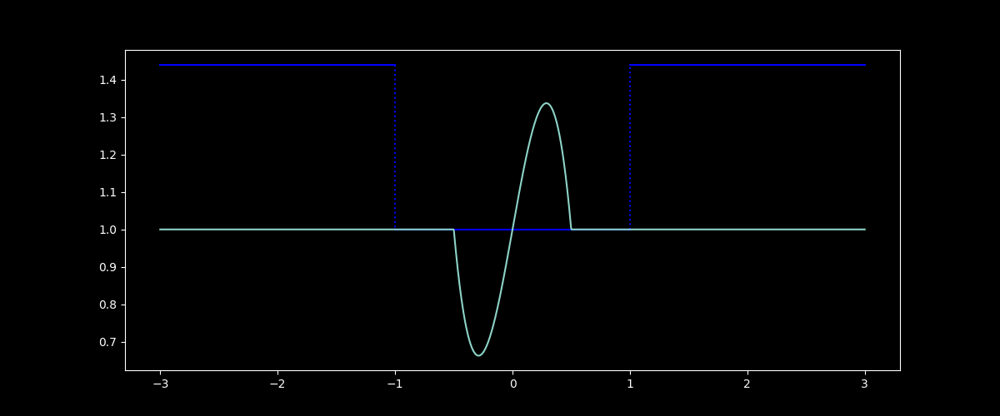

In [8]:
A.plot_refractive_index()
A.add_1d_plot(f0_shifted)

# Check for guided modes

Doesn't seem like it should have any

In [9]:
mode_type = 'guided'


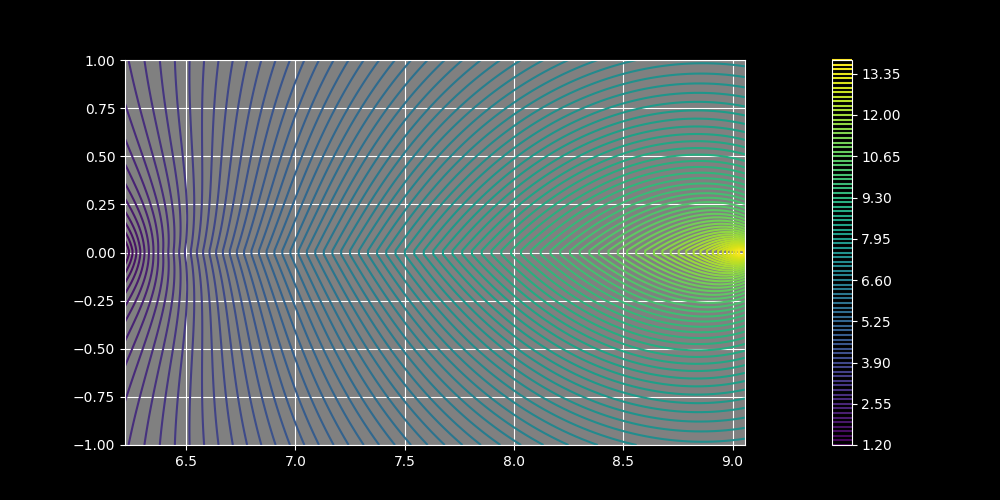

In [7]:
plotlogf(A.determinant, .99*A.K_low, 1.001*A.K_high, -1,1, field_type, mode_type,
         figsize=(10,5),iref=100, rref=100,levels=100)

No guided modes.

In [18]:
xs = np.linspace(-12,12, 1000)

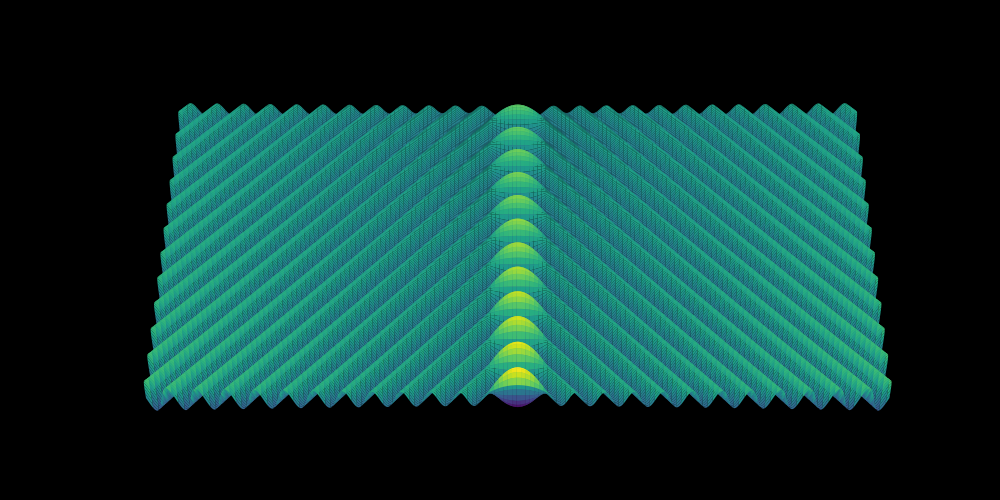

In [29]:
A.plot_field_2d_surface(Fs1, xs=xs, zmin=0, zmax=12, zref=500, colorbar=False, figsize=(10,5),
               rstride=2, cstride=6);


## Leaky Modes

In [10]:
mode_type = 'leaky'

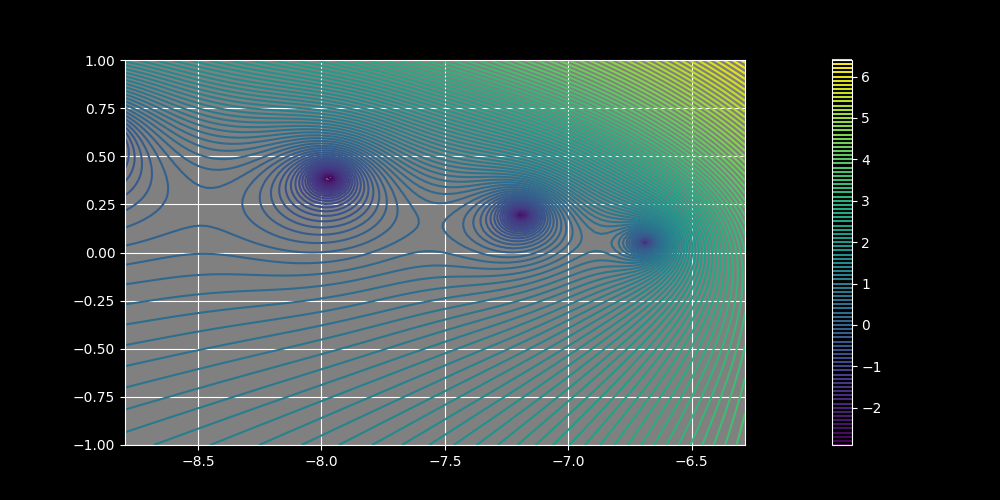

In [54]:
plotlogf(A.determinant_Z, -1.4*A.K_low, -A.K_low, -1,1, field_type, mode_type,
         figsize=(10,5),iref=100, rref=100,levels=100)

In [55]:
Z0 = newton(A.determinant_Z, np.array(-7.2), args=(field_type, mode_type))
print(Z0)
plt.plot(Z0.real, Z0.imag, 'ro');

(-7.189385165380596+0.19591923804313094j)


In [56]:
FsZ = A.fields_Z(Z0, field_type=field_type, mode_type=mode_type)


In [68]:
xs = np.linspace(-10, 10, 600)

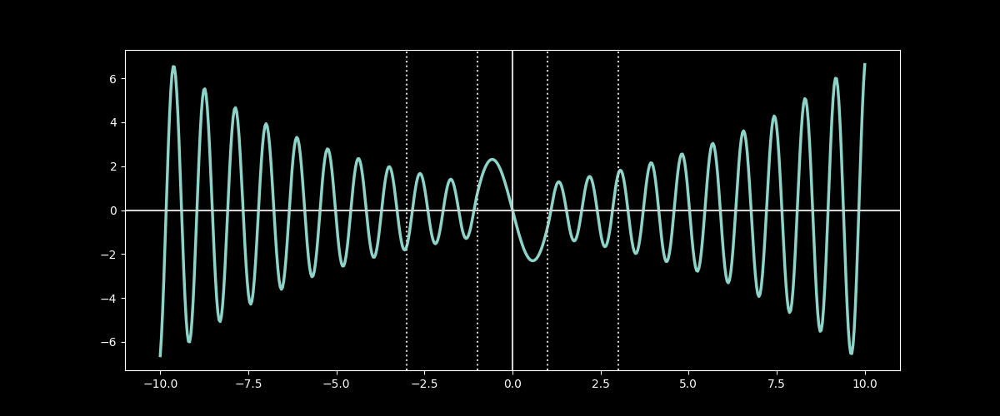

In [69]:
A.plot_field_1d(FsZ, xs=xs, linewidth=2.5);

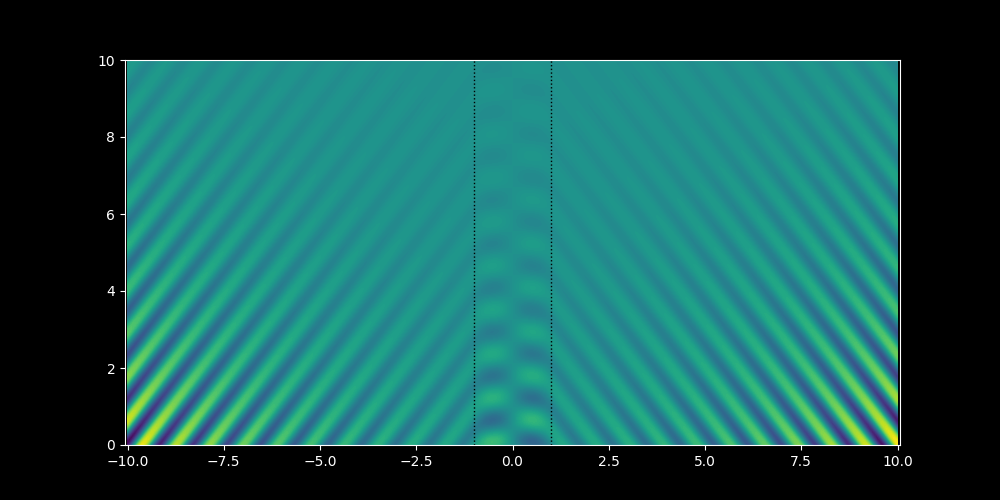

In [65]:
A.plot_field_2d(FsZ, xs=xs, zmin=0, zmax=10, zref=500, colorbar=False, levels=100, maxdim=10)
plt.axis('equal');

# Propagation of input



In [20]:
Propagator_Class = A.propagator()

In [21]:
paper_method=False

In [22]:
# P1e = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=0.001, RZ=6, NZ=100, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)
P1o = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=0.001, RZ=6, NZ=100, 
                     field_type=field_type, 
                     sign='-1', paper_method=paper_method)

 92% (92 of 100) |#####################  | Elapsed Time: 0:00:00 ETA:   0:00:00

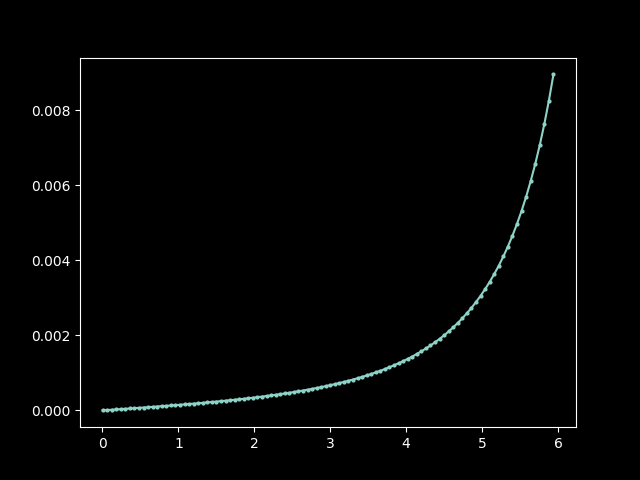

In [23]:
plt.close('all')
# plt.plot(P1e.Zs, np.abs(P1e.alphas.real), marker='o', markersize=2)
plt.plot(P1o.Zs, np.abs(P1o.alphas.real), marker='o', markersize=2)

In [24]:
# P2e = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=6, RZ=7, NZ=100, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)
P2o = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=6, RZ=7, NZ=100, 
                     field_type=field_type, 
                     sign='-1', paper_method=paper_method)

 98% (98 of 100) |###################### | Elapsed Time: 0:00:00 ETA:   0:00:00

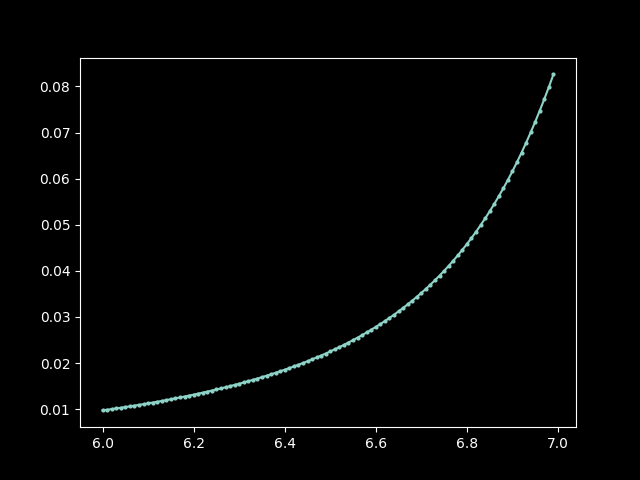

In [25]:
plt.close('all')
# plt.plot(P2e.Zs, np.abs(P2e.alphas.real), marker='o', markersize=2)
plt.plot(P2o.Zs, np.abs(P2o.alphas.real), marker='o', markersize=2)

In [28]:
# P3e = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=7, RZ=A.Z_evanescent.real, NZ=200, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)
P3o = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=7, RZ=A.Z_evanescent.real, NZ=200, 
                     field_type=field_type, 
                     sign='-1', paper_method=paper_method)

 96% (193 of 200) |##################### | Elapsed Time: 0:00:01 ETA:   0:00:00

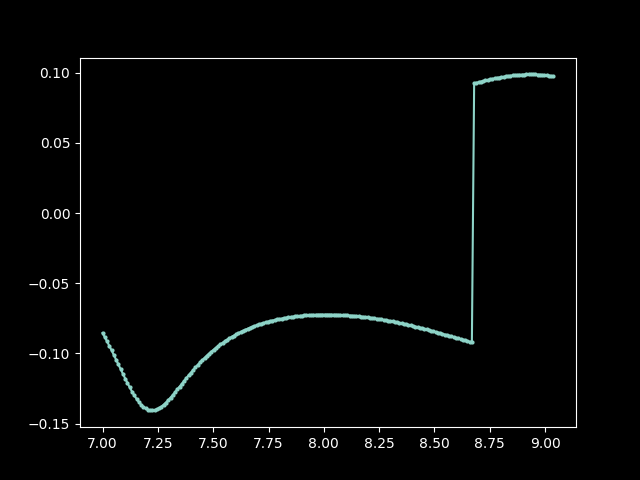

In [29]:
plt.close('all')
# plt.plot(P3e.Zs, P3e.alphas.real, marker='o', markersize=2)
plt.plot(P3o.Zs, P3o.alphas.real, marker='o', markersize=2)

In [30]:
# P4e = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=A.Z_evanescent.real, RZ=14, NZ=100, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)
P4o = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=A.Z_evanescent.real, RZ=14, NZ=100, 
                     field_type=field_type, 
                     sign='-1', paper_method=paper_method)

 97% (97 of 100) |###################### | Elapsed Time: 0:00:00 ETA:   0:00:00

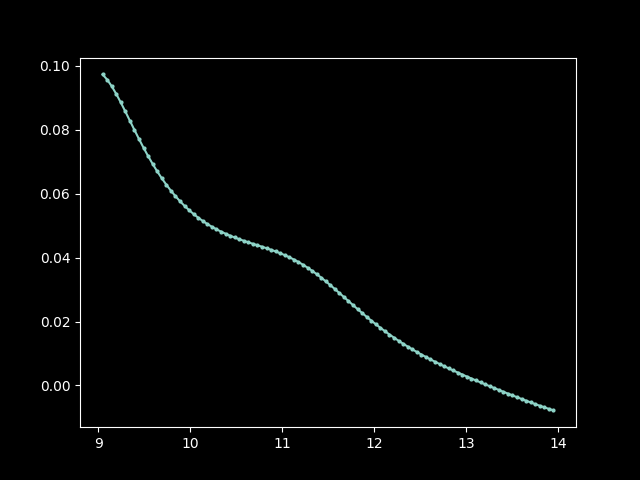

In [31]:
plt.close('all')
# plt.plot(P4e.Zs, P4e.alphas.real, marker='o', markersize=2)
plt.plot(P4o.Zs, P4o.alphas.real, marker='o', markersize=2)

In [32]:
# P5e = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=14, RZ=20, NZ=150, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)
P5o = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=14, RZ=20, NZ=150, 
                     field_type=field_type, 
                     sign='-1', paper_method=paper_method)

 98% (147 of 150) |##################### | Elapsed Time: 0:00:02 ETA:   0:00:00

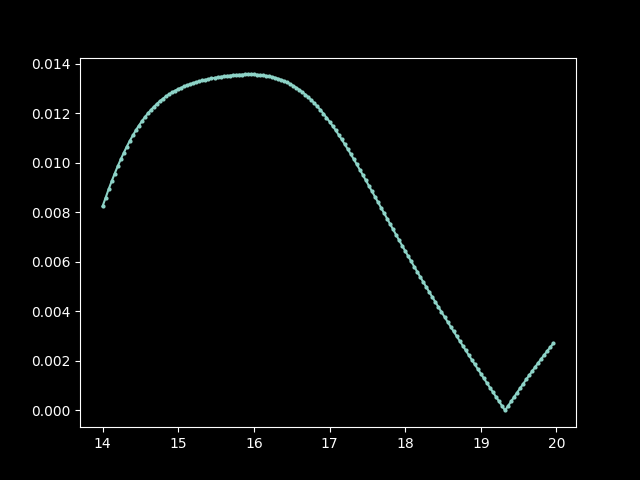

In [33]:
plt.close('all')
# plt.plot(P5e.Zs, np.abs(P5e.alphas.real), marker='o', markersize=2)
plt.plot(P5o.Zs, np.abs(P5o.alphas.real), marker='o', markersize=2)

In [34]:
# P6e = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=20, RZ=50, NZ=200, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)
P6o = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=20, RZ=50, NZ=200, 
                     field_type=field_type, 
                     sign='-1', paper_method=paper_method)

 99% (198 of 200) |##################### | Elapsed Time: 0:00:04 ETA:   0:00:00

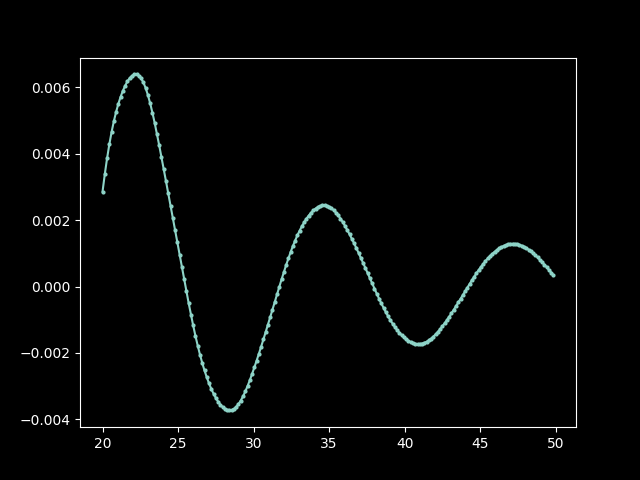

In [35]:
plt.close('all')
# plt.plot(P6e.Zs, P6e.alphas.real, marker='o', markersize=2)
plt.plot(P6o.Zs, P6o.alphas.real, marker='o', markersize=2)

In [44]:
# P7 = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=50, RZ=100, NZ=150, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)

In [45]:
# plt.close('all')
# plt.plot(P7.Zs, P7.alphas.real, marker='o', markersize=2)

In [46]:
# P8 = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
#                      LZ=100, RZ=150, NZ=100, 
#                      field_type=field_type, 
#                      sign='+1', paper_method=paper_method)

In [47]:
# plt.close('all')
# plt.plot(P8.Zs, P8.alphas.real, marker='o', markersize=2)

### Combine propagators into one function

In [36]:
# Pse = [P1e, P2e, P3e, P4e, P5e, P6e]
Pso = [P1o, P2o, P3o, P4o, P5o, P6o]
Ps = Pso
portion = 'full'

full = lambda x: sum([P.slice_propagate(x, portion=portion) for P in Ps])
Full = lambda x, z : sum([P.propagate(x, zs=z, portion=portion) for P in Ps])

diff = lambda x: full(x) - f0(x)

# 1D Plot


In [37]:
xs = np.linspace(-6, 6, 10000)


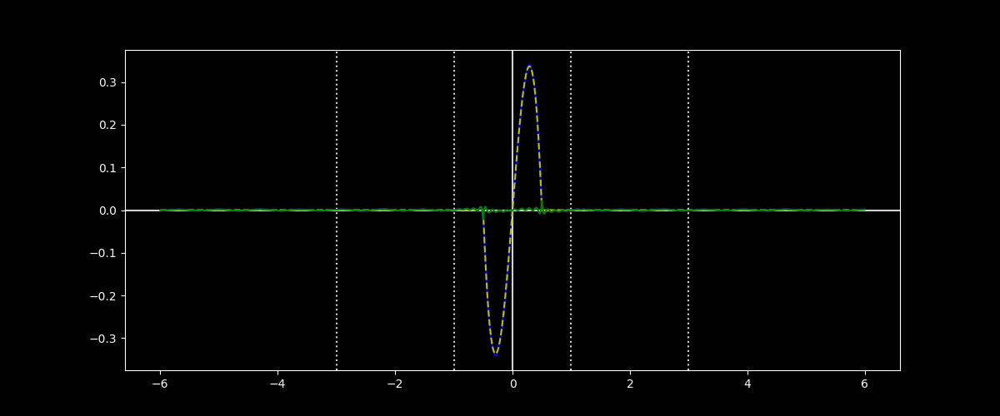

In [38]:
A.plot_field_1d(full, xs=xs, part='real', color='blue');
A.add_1d_plot(f0, xs=xs, linestyle='--', color='y')
A.add_1d_plot(diff, xs=xs, color='g')

## Slice along Z axis

In [70]:
portion = 'full'
slice_at = 0.5
constant_variable = 'x'

full_z = lambda x: sum([P.slice_propagate(x, portion=portion, slice_at=slice_at, constant_variable=constant_variable) for P in Ps])


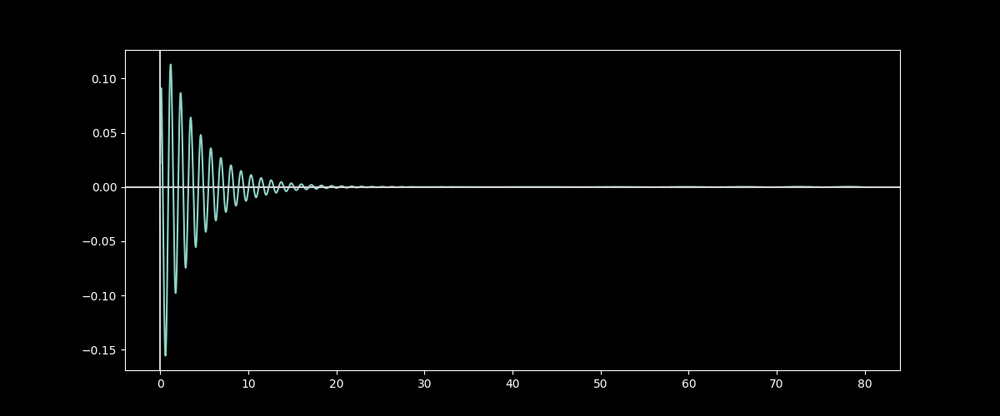

In [71]:
A.plot_field_1d(full_z, xs=np.linspace(0,80,2000), part='real', plot_Rhos=False);


## 2D Plots

In [72]:
xs = np.linspace(-10, 10, 800)

(<Figure size 700x560 with 2 Axes>, <Axes: >)

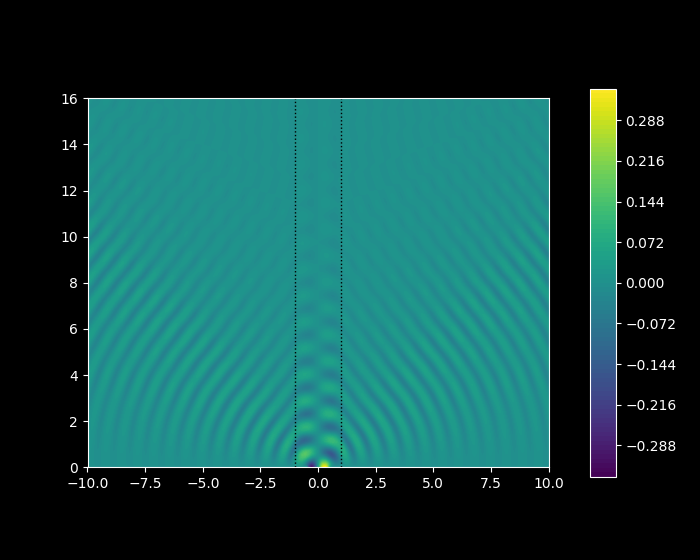

In [73]:
A.plot_field_2d(Full, xs=xs, zmin=0, zmax=16, zref=250, maxdim=7, levels=100, colorbar=True)


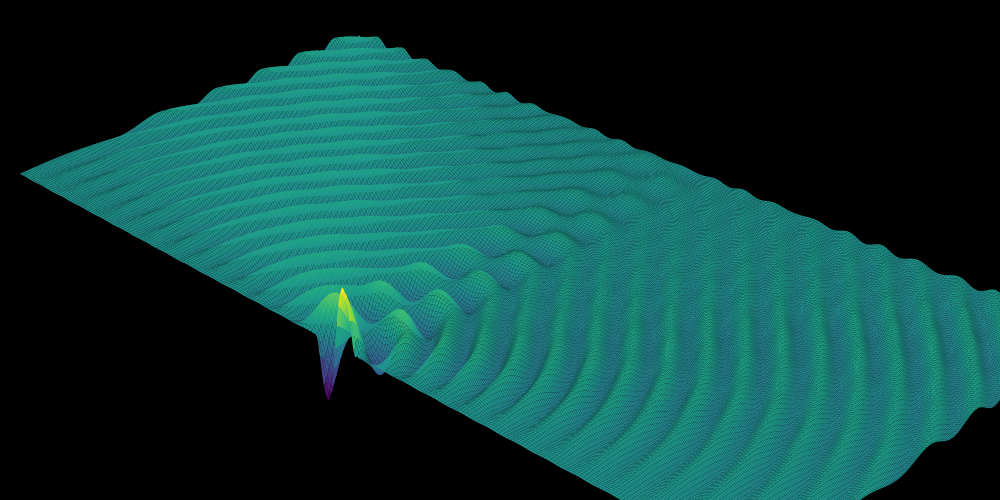

In [51]:
A.plot_field_2d_surface(Full, xs=xs, colorbar=False, zoom=3.5,
                        azim=-47, elev=30, 
                        zmax=10, zref=200,
                        rstride=1, cstride=3);

## Compare to leaky mode

## Forming leaky mode from contour integral

Leaky modes should arise from residuals when deforming contour of integration to steepest descent path.  But I don't know how to calculate the residuals analytically.  Here I try to do it numerically by doing a circular contour integration around a leaky mode propagation constant in the complex plane.  First I'll grab that propagation constant in the Z plane:

### Paper method

We discovered from the notebook Integrand/Full/Exact_Delta_Integrand_and_Contour_Integrals that with the paper method there are poles in the negative real part of the complex plane that appear to work.  These appear at what would be "leaky" mode_types with negative real parts.  Need to understand how it is that these can give correct decay and propagation direction.

In [52]:
mode_type='leaky'
paper_method = True

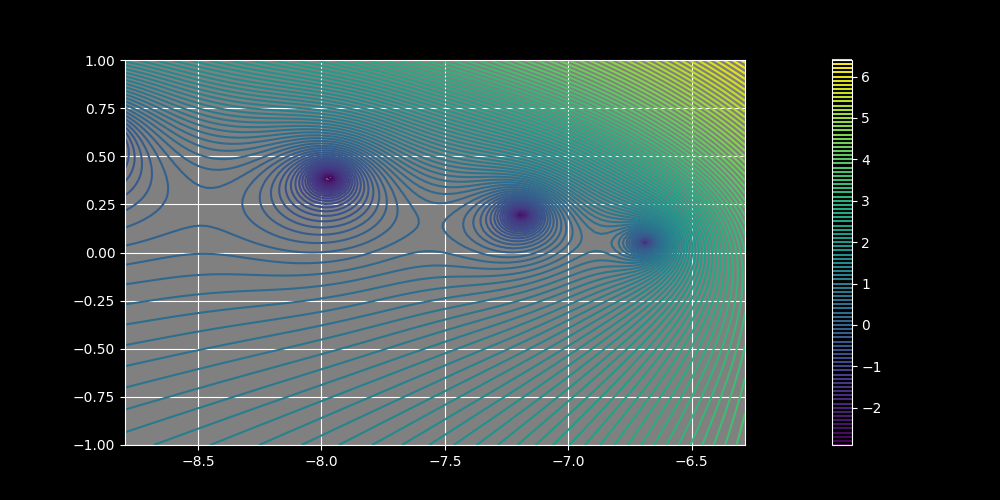

In [75]:
plotlogf(A.determinant_Z, -1.4*A.K_low, -A.K_low, -1,1, field_type, mode_type,
         figsize=(10,5),iref=100, rref=100,levels=100)

In [76]:
Z_leaky = newton(A.determinant_Z, -7.1, args=('TE', mode_type))
print(Z_leaky, A.determinant_Z(Z_leaky, mode_type=mode_type))
plt.plot(Z_leaky.real, Z_leaky.imag, 'ro');

(-7.189385165380596+0.195919238043131j) (-3.2366924293547355e-15-2.41817736283978e-15j)


In [77]:
circ_contour = {'center': Z_leaky, 'radius': 1e-4, 'N':30}

In [78]:
P_leaky_even = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=100, RZ=150, NZ=10, 
                     field_type=field_type, 
                     sign='+1', circ_contour=circ_contour, paper_method=paper_method)
P_leaky_odd = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=100, RZ=150, NZ=10, 
                     field_type=field_type, 
                     sign='-1', circ_contour=circ_contour, paper_method=paper_method)

 76% (23 of 30) |##################      | Elapsed Time: 0:00:00 ETA:   0:00:00

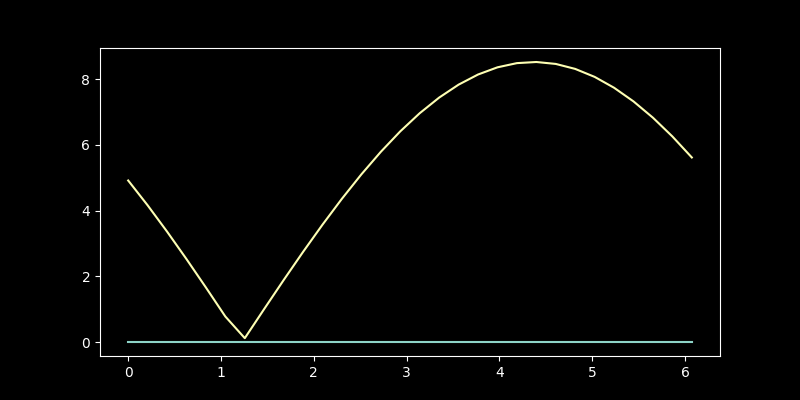

In [79]:
plt.close('all')
fig, ax = plt.subplots(1, figsize=(8,4))
ax.plot(P_leaky_even.ts,  np.abs(P_leaky_even.alphas.real));
ax.plot(P_leaky_odd.ts,  np.abs(P_leaky_odd.alphas.real));

In [80]:
P_ls = [P_leaky_even, P_leaky_odd]
portion = 'full'

full_leaky = lambda x : sum([P.slice_propagate(x, portion=portion) for P in P_ls])
Full_leaky = lambda x, z : sum([P.propagate(x, zs=z, portion=portion) for P in P_ls])
Leaky_Diff = lambda x,z: Full(x,z) - Full_leaky(x, z)

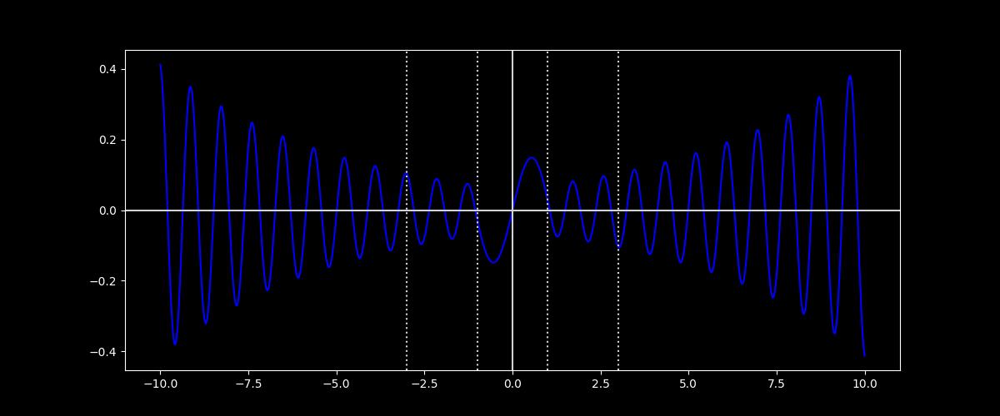

In [81]:
A.plot_field_1d(full_leaky, xs=xs, part='real', color='blue');

### 2d Plots of real field and leaky mode field

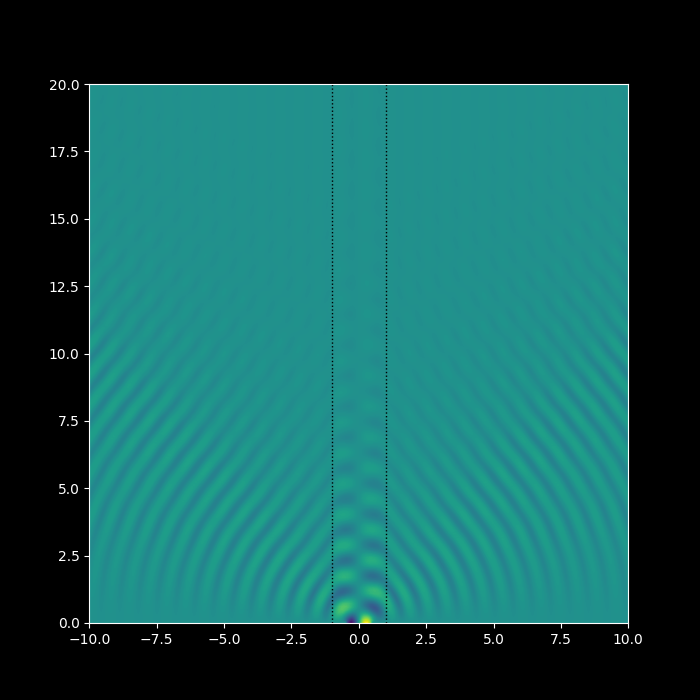

In [89]:
fig, ax = A.plot_field_2d(Full, xs=xs, zmin=0, zmax=20, zref=200, maxdim=7, levels=150, colorbar=False);

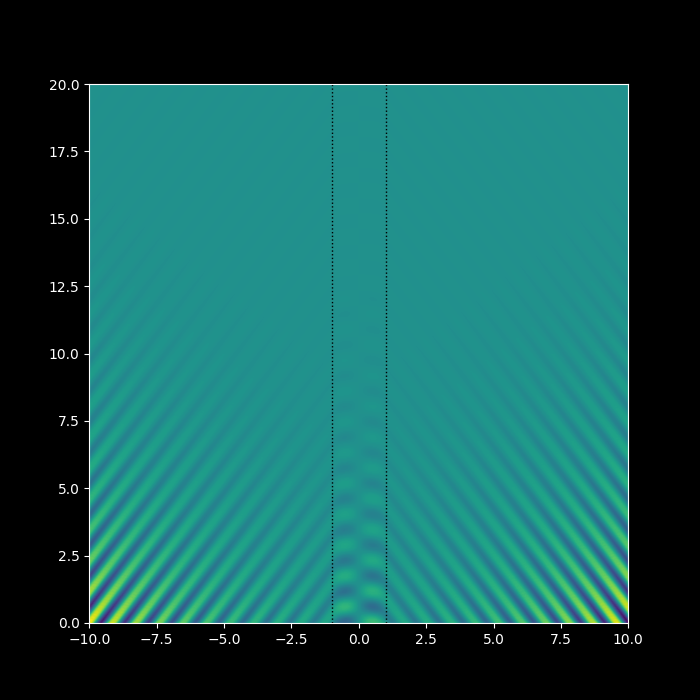

In [88]:
A.plot_field_2d(Full_leaky, xs=xs, zmin=0, zmax=20, zref=200, maxdim=7, levels=150, colorbar=False);

Difference between fields above.

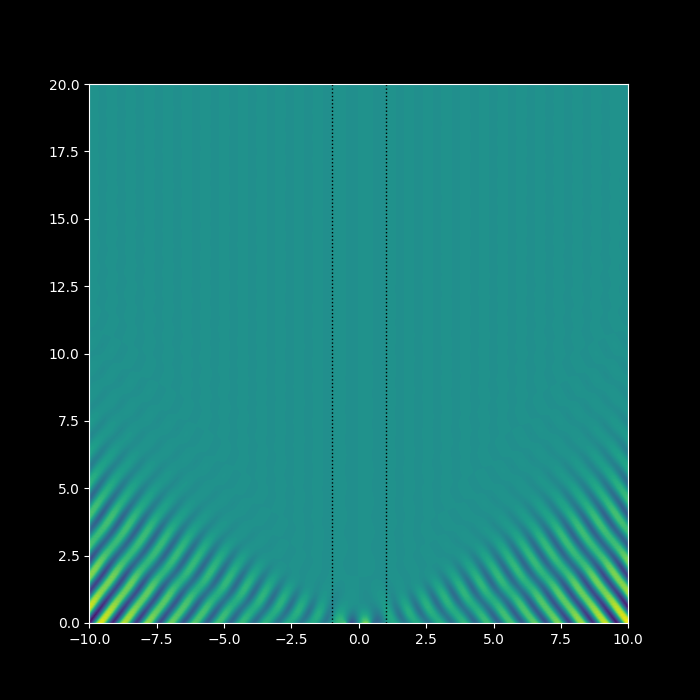

In [91]:
A.plot_field_2d(Leaky_Diff, xs=xs, zmin=0, zmax=20, zref=200, maxdim=7, 
                levels=120, colorbar=False);


#### Asymptotics

Looking at a slice:

In [104]:
slice_at_x = 0.5
constant_variable = 'x'

full_z_leaky = lambda z: sum([P.slice_propagate(z, slice_at=slice_at_x, constant_variable=constant_variable) for P in P_ls])
full_z = lambda z: sum([P.slice_propagate(z, slice_at=slice_at_x, constant_variable=constant_variable) for P in Ps])


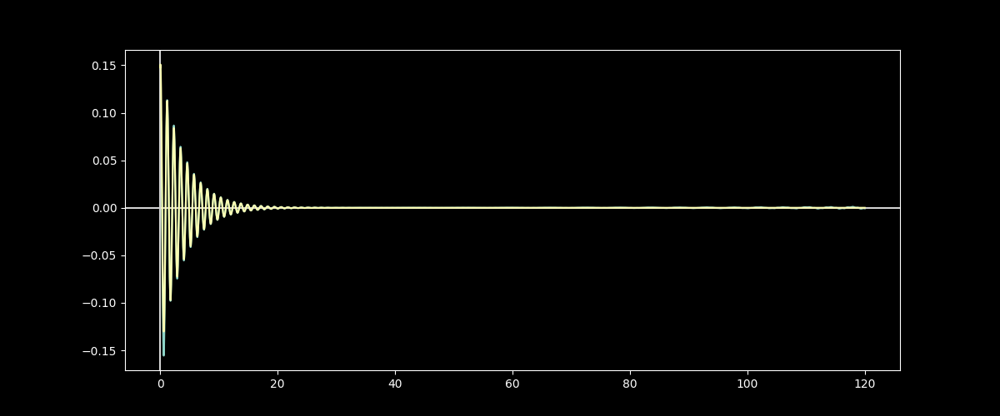

In [105]:
A.plot_field_1d(full_z, xs=np.linspace(0,120,4000), part='real', plot_Rhos=False);
A.add_1d_plot(full_z_leaky, xs=np.linspace(0,120,4000), part='real');


### Animations

In [107]:
# A.animate_field_2d(Full_leaky, 'leaky_mode_antiguide_contour',xs=xs, zs=np.linspace(0,10,300), 
#                    figsize=(10,5), secs=2)

In [105]:
Video('leaky_mode_antiguide_contour.mp4', html_attributes="controls loop")


Seems to be converging to an actual leaky mode.  That's cool.  We still have this inconsistency in direction of decay however.  Let's look at animation to see if it's outgoing:

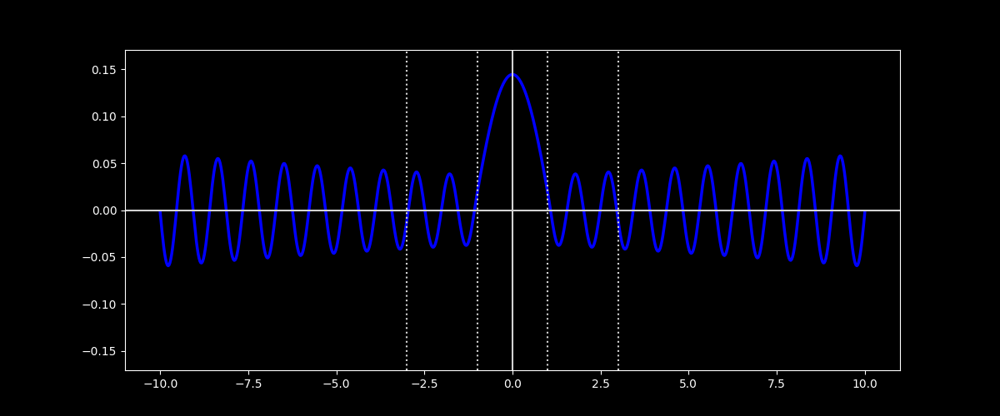

In [108]:
A.animate_field_1d(full_leaky, 'leaky', xs=xs, linewidth=2.5, secs=3, fps=32)

In [109]:
Video('leaky.mp4', html_attributes="controls loop")


### Our method

This still has issues: all the contour integrals go to zero.

In [106]:
mode_type='guided'
# mode_type='leaky'
paper_method = False

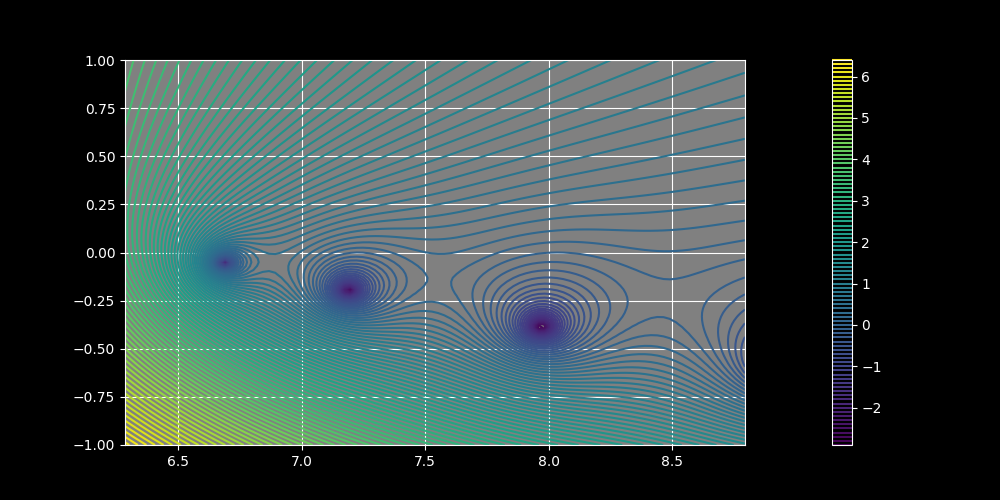

In [107]:
plotlogf(A.determinant_Z, A.K_low, 1.4*A.K_low, -1,1, field_type, mode_type,
         figsize=(10,5),iref=100, rref=100,levels=100)

In [108]:
Z_leaky = newton(A.determinant_Z, 6.5, args=('TE', mode_type))
Z_leaky, A.determinant_Z(Z_leaky, mode_type=mode_type)
plt.plot(Z_leaky.real, Z_leaky.imag, 'ro');

In [109]:
circ_contour = {'center': Z_leaky, 'radius': 1e-6, 'N':30}

In [110]:
P_leaky_even = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=100, RZ=150, NZ=10, 
                     field_type=field_type, 
                     sign='+1', circ_contour=circ_contour, paper_method=paper_method)
P_leaky_odd = Propagator_Class(f0=f0, Lx=-.5, Rx=.5, 
                     LZ=100, RZ=150, NZ=10, 
                     field_type=field_type, 
                     sign='-1', circ_contour=circ_contour, paper_method=paper_method)

 80% (24 of 30) |###################     | Elapsed Time: 0:00:00 ETA:   0:00:00

In [111]:
P_ls = [P_leaky_even, P_leaky_odd]

full_leaky = lambda x : sum([P.slice_propagate(x) for P in P_ls])
Full_leaky = lambda x, z : sum([P.propagate(x, zs=z) for P in P_ls])

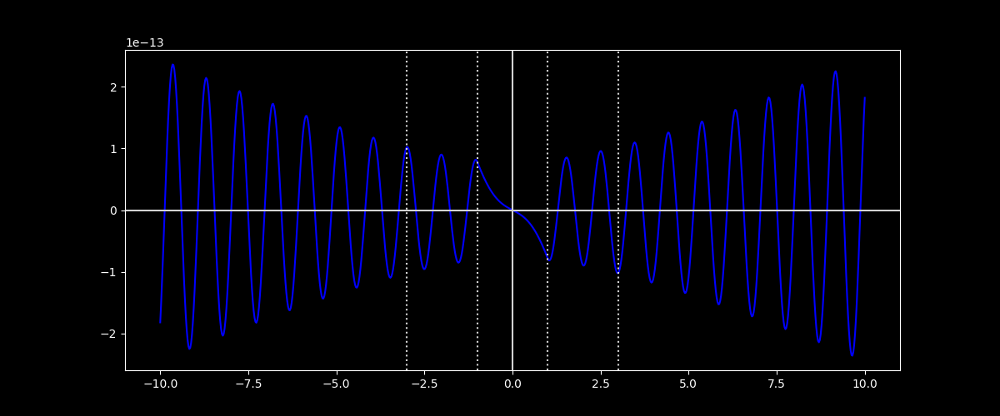

In [112]:
A.plot_field_1d(full_leaky, xs=xs, part='real', color='blue');

#### Issues:

- Using our method, even though there appears to be a pole in the integrand where we need it to be, when we do a circular contour integral it appears to zero out.  Everything should be right, but we get zero...  This happens for all other pole locations too: -Z, Z.conj(), -Z.conj().

- This is strange because when we do this for the delta function input everything works out: we get convergent leaky mode fields.


## Save data for visualization

In [178]:
propfuncs = [P1, P2, P3]
evfuncs = [P4, P5, P6, P7, P8]

In [179]:
Prop = lambda x, z: sum([f.propagate(x, zs=z) for f in propfuncs])
Ev = lambda x, z: sum([f.propagate(x, zs=z) for f in evfuncs]) 
Full = lambda x, z: Prop(x, z) + Ev(x, z)

In [195]:
xs = np.linspace(-15, 15, 1200)
zs = np.linspace(0, 20, 600)


In [196]:
f0s = f0(xs)

In [197]:
rad_ys_propagating = Prop(xs, zs)

In [198]:
rad_ys_evanescent = Ev(xs, zs)


In [199]:
Xs, Zs = np.meshgrid(xs, zs)

In [200]:
def get_trig_indices(mesh_array):
    '''Get triangle index list for three js mesh formation via indexed buffer geometry.'''
    if len(mesh_array.shape) <= 1:
        raise ValueError('Provide meshgrid array as input.')
    Nz, Nx = mesh_array.shape[0], mesh_array.shape[1]
    l_inds = Nx * Nz
    indices =  np.arange(0, l_inds).reshape((Nx, Nz)).T  # Note transpose
    fbases = indices[:Nz-1, :Nx-1].T.flatten()  # Note transpose and index switch due to transpose
    f1 = np.array([[i, i+Nz, i+1] for i in fbases], dtype=int)
    f2 = np.array([[i+1, i+Nz, i+Nz+1] for i in fbases], dtype=int)
    return np.concatenate((f1, f2))


def get_base_vertices(Xs, Zs):
    '''Get vertices of triangles with zero height (y component in three.js).'''
    if Xs.shape != Zs.shape:
        raise ValueError('Provide meshgrid arrays (ie Xs, Zs = np.meshgrid(xs,zs)) as inputs.')
    Base = np.array([Xs, np.zeros_like(Xs), Zs], dtype=float)
    L = Xs.shape[0] * Xs.shape[1]
    base_vertices = Base.T.reshape((L,3))
    return base_vertices


def create_height_array_from_complex(ys, Xs):
    '''Get data for height from complex ys input (needs to be formatted as list:
        [ys[0].real, ys[0].imag, ys[1].real, ys[1].imag, ... ].'''
    L = Xs.shape[0] * Xs.shape[1]
    Ys = np.array([ys.real, ys.imag], dtype=float)
    heights = Ys.T.reshape((L,2))
    return heights


def save_trig_indices_as_json(filepath, mesh_array):
    indices = get_trig_indices(mesh_array)
    with open(filepath + '.json', 'w') as outfile:
        json.dump(indices.flatten().tolist(), outfile, separators=(',', ':'),
                  sort_keys=True, indent=4)


def save_base_vertices_as_json(filepath, Xs, Zs):
    base_vertices = get_base_vertices(Xs, Zs)
    with open(filepath + '.json', 'w') as outfile:
        json.dump(base_vertices.flatten().tolist(), outfile, separators=(',', ':'),
                  sort_keys=True, indent=4)
        

def save_heights_as_json(filepath, ys, Xs):
    heights= create_height_array_from_complex(ys, Xs)
    with open(filepath + '.json', 'w') as outfile:
        json.dump(heights.flatten().tolist(), outfile, separators=(',', ':'),
                  sort_keys=True, indent=4)

def save_values_as_json(filepath, f0s):
    with open(filepath + '.json', 'w') as outfile:
        json.dump(f0s.tolist(), outfile, separators=(',', ':'),
                  sort_keys=True, indent=4)




In [201]:
prefix='/home/pv/local/slab/apps/antiguide/'

In [202]:
save_trig_indices_as_json(prefix + 'trig_indices_new', Xs)


In [203]:
save_base_vertices_as_json(prefix + 'base_vertices_new', Xs, Zs)


In [204]:
save_heights_as_json(prefix + 'evanescent_heights', rad_ys_evanescent, Xs)


In [205]:
save_heights_as_json(prefix + 'propagating_heights', rad_ys_propagating, Xs)


In [206]:
save_values_as_json(prefix + 'f0s', f0s)


In [207]:
save_values_as_json(prefix + 'x0s', xs)


# Previous Observations

These may or may not still hold, keeping them here for later reference as I fix things.

Current issues in this:
- With our method, the modes converge to zero, using both leaky and guided mode types. 
- With paper method, modes converge to non-trivial result using leaky mode type, but to zero using guided mode type.
- Using the negative values of the propagation constants switches behavior for paper method, doesn't do anything for non-paper method.
- Overall it does look like we want guided mode type for leaky modes too, then just take complex roots of guided mode eigenvalue equation.  This gives correct direction of propagation/increase/outgoing-ness.


- If we use paper method, there is no pole where we need it to be.  We can integrate around a pole in the positive imaginary part of C.  In that case it's also mot outgoing because of issue with decay direction.  We can switch this by switching sign of z coordinate, but that's cheating.

### Leaky mode coefficient

In [64]:
integrand = lambda x: P1e.f0(x) * FsZ(x).conjugate()
alpha = quad(integrand, -1,1, complex_func=True)[0]
alpha

(0.3760763656953411+0.5849896599291433j)

Not clear how to normalize leaky modes though.

In [65]:
scale = .25/FsZ(0)

In [66]:
scale

array([0.02969895+0.04810642j])

In [71]:
Leaky_Diff = lambda x,z: Full(x,z) - .6*scale * FsZ(x,z)
Scaled_leaky = lambda x, z: .6*scale * FsZ(x,z)
scaled_leaky = lambda x: .6*scale * FsZ(x)

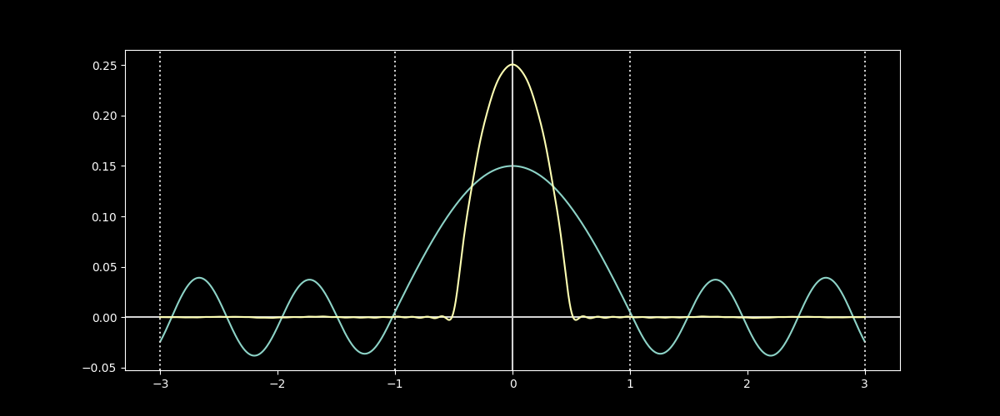

In [72]:
A.plot_field_1d(scaled_leaky);
A.add_1d_plot(full)

In [74]:
leaky_z = lambda z: .6*scale*FsZ([0],z)


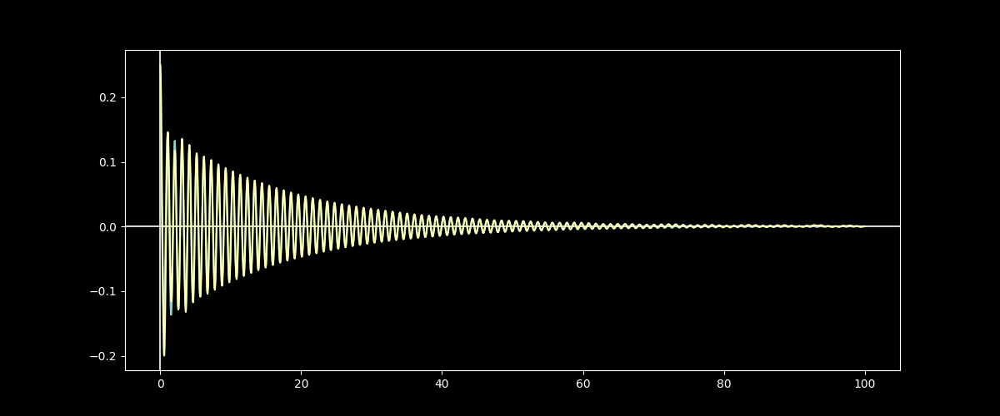

In [75]:
A.plot_field_1d(leaky_z, xs=np.linspace(0,100,3000), part='real', plot_Rhos=False);
A.add_1d_plot(full_z, xs=np.linspace(0,100,3000), part='real');


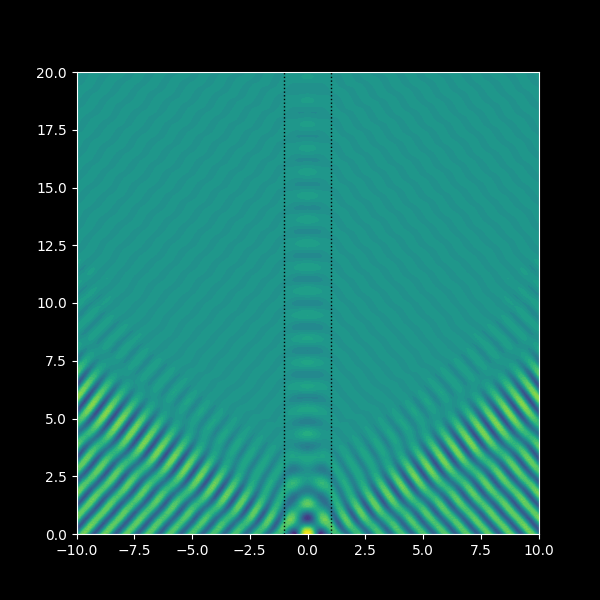

In [76]:
A.plot_field_2d(Leaky_Diff, xs=xs, zmin=0, zmax=20, zref=200, maxdim=6, levels=40, colorbar=False);


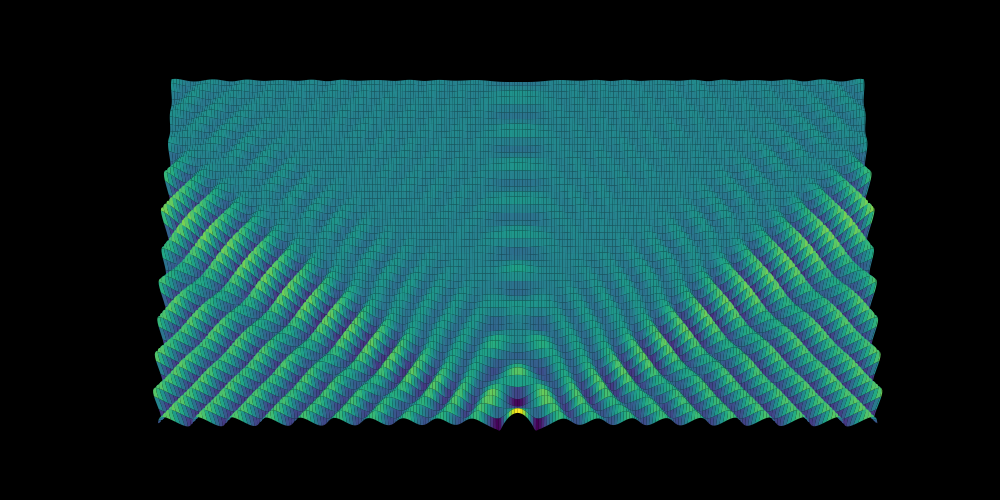

In [54]:
A.plot_field_2d_surface(Leaky_Diff, xs=xs, colorbar=False, zoom=2.5,
                        azim=-90, elev=75, 
                        zmax=10, zref=150,
                        rstride=3, cstride=3);